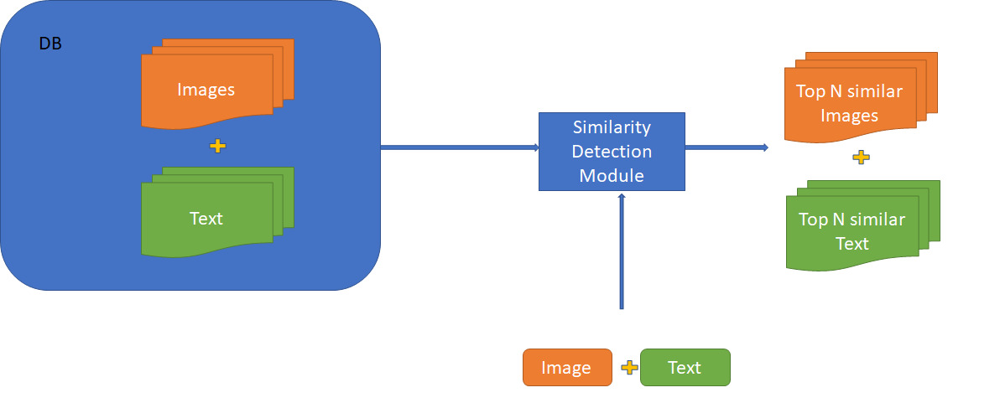

In [1]:

import numpy as np
import pandas as pd
import tensorflow as tf

In [2]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
assert len(physical_devices) > 0, "Not enough GPU hardware devices available"
config = tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
train_df = pd.read_csv(r'd:/shopee-product-matching/train.csv')

In [4]:
train_df.head(10)

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069
5,train_2464356923,0013e7355ffc5ff8fb1ccad3e42d92fe.jpg,bbd097a7870f4a50,CELANA WANITA (BB 45-84 KG)Harem wanita (bisa...,2660605217
6,train_1802986387,00144a49c56599d45354a1c28104c039.jpg,f815c9bb833ab4c8,Jubah anak size 1-12 thn,1835033137
7,train_1806152124,0014f61389cbaa687a58e38a97b6383d.jpg,eea7e1c0c04da33d,KULOT PLISKET SALUR /CANDY PLISKET /WISH KULOT...,1565741687
8,train_86570404,0019a3c6755a194cb2e2c12bfc63972e.jpg,ea9af4f483249972,"[LOGU] Tempelan kulkas magnet angka, tempelan ...",2359912463
9,train_831680791,001be52b2beec40ddc1d2d7fc7a68f08.jpg,e1ce953d1a70618f,BIG SALE SEPATU PANTOFEL KULIT KEREN KERJA KAN...,2630990665


In [60]:
print(len(train_df))

34250


In [5]:
print(len(train_df['label_group'].unique()))


11014


In [6]:
labelGroup_df = train_df.groupby('label_group')

In [10]:
import matplotlib.pyplot as plt
from PIL import Image

258047
Sarung celana wadimor original 100% dewasa dan anak hitam dan putih polos


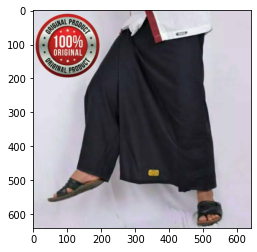

SARUNG CELANA WADIMOR DEWASA HITAM POLOS SARCEL


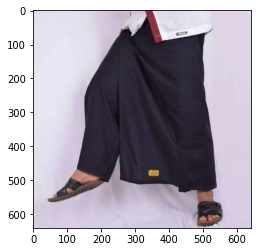

WARNA RANDOM ACAK Sarung Celana Wadimor MURAH Celana Sarung WADIMOR


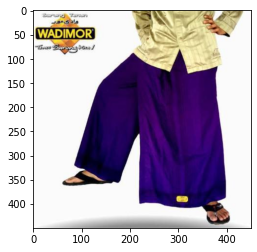

297977
Wall Sticker / WallSticker -  Submarine Measure - SK9222


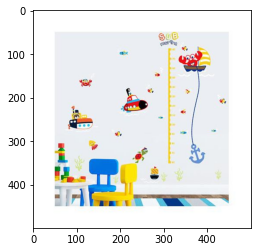

RELIZA WALL STICKER PENGUKUR TINGGI BADAN JERAPAH STIKER DINDING XL8337


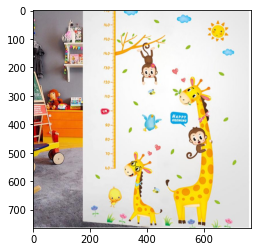

645628
GROSIR LVN COLLAGEN / COLAGEN STROBERI PEMUTIH KULIT 1 BOX ISI 10 SACHET


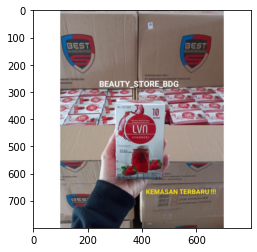

DISTRIBUTOR LVN COLLAGEN STROBERI / COLAGEN 1 BOX (10 sachet)


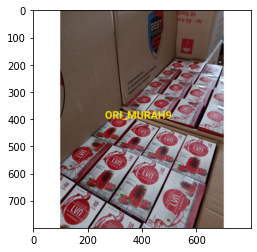

TERMURAH LVN COLLAGEN STROBERI 1 BOX 10 SACHET


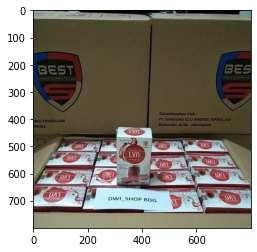

801176
mainan bayi gantung putar musik merry go round


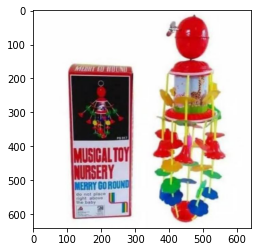

MERRY GO ROUND MAINAN BAYI GANTUNG MUSIK PUTAR/KERINCINGAN BAYI


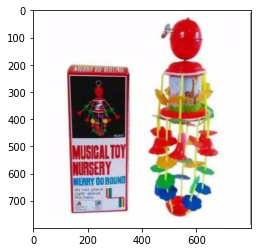

887886
TP-LINK Wireless N Router TL-WR940N 450Mbps TP LINK TL WR940N


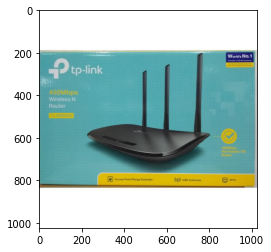

TP-LINK Wireless N Router TL-WR940N 450Mbps TP LINK


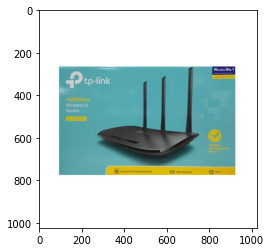

942089
Slim Door Guard Protector Pelindung Pintu Mobil Universal 8 pcs P-2


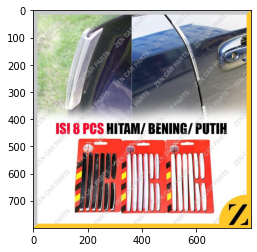

Pelindung Pintu Mobil Slim Door Guard Protector Universal 8 pcs HT-001


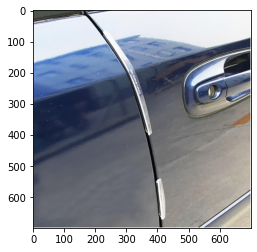

2942125
[Bayar Di Tempat]Perhiasan Bros Desain Kucing dengan Mutiara Imitasi Warna Putih untuk Wanita


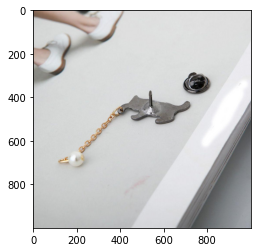

Bros Pin Bentuk Kartun Kucing Dengan Mutiara Imitasi Untuk Wanita


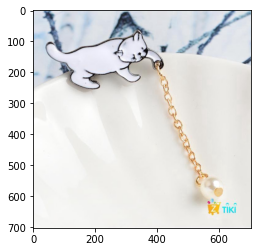

COD\xef\xbc\x88Yimi\xef\xbc\x89Kreatif Kecil Yang Lucu Putih Mutiara Kucing Bros Pins Chic Fashion Jewelry Bros


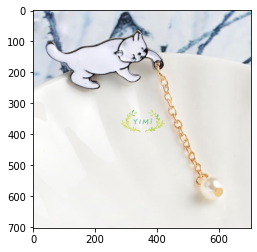

3108272
\xe2\x9c\xa8Co\xe2\x9c\xa8Sarung Jok Sepeda 3D Bahan Silikon Lembut


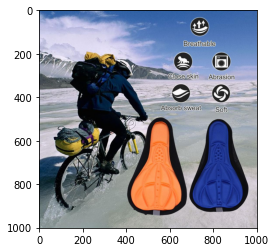

Sarung Jok Sepeda 3D Bahan Silikon Lembut


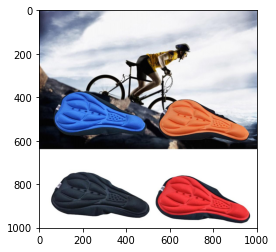

4063438
Headset U19 Hifi Macaroon Mate Color Hifi Extra Bass


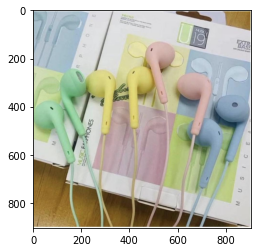

Earphone Macaron U19 VIVO


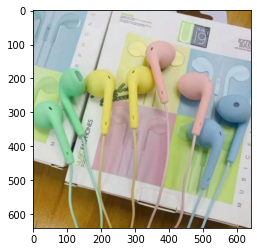

4262657
TU88 Pouch Kosmetik Bunny POMPOM Bahan Bulu Travel Pouch Cosmetic Organizer Kelinci - PBN


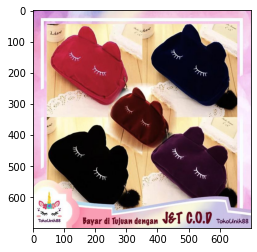

[OS821] POUCH KOSMETIK BUNNY POM POMPOM / POUCH KOSMETIK MINI / TAS KOSMETIK KECIL / POUCH KOSMETIK


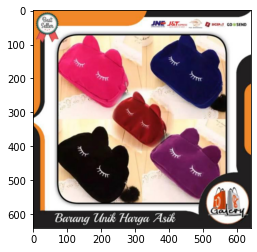

In [11]:
%matplotlib inline


groupCount = 0
for groupName,groupDf in labelGroup_df:
    print(groupName)
    imgCount=0
    for index,row in groupDf.iterrows():
        print(row['title'])
        imagePath = 'd:/shopee-product-matching/train_images/'+row['image']
        pil_im = Image.open(imagePath, 'r')
        plt.figure()
        plt.imshow(pil_im)
        plt.show()
        imgCount= imgCount+1
        if (imgCount==3):
            break
            
    groupCount = groupCount +1
    if (groupCount==10):
        break

In [12]:
from sklearn.model_selection import train_test_split


y = train_df.pop('label_group')
X = train_df

X_train,X_test,y_train,y_test = train_test_split(X,y,stratify=y,test_size=0.4,random_state=0)

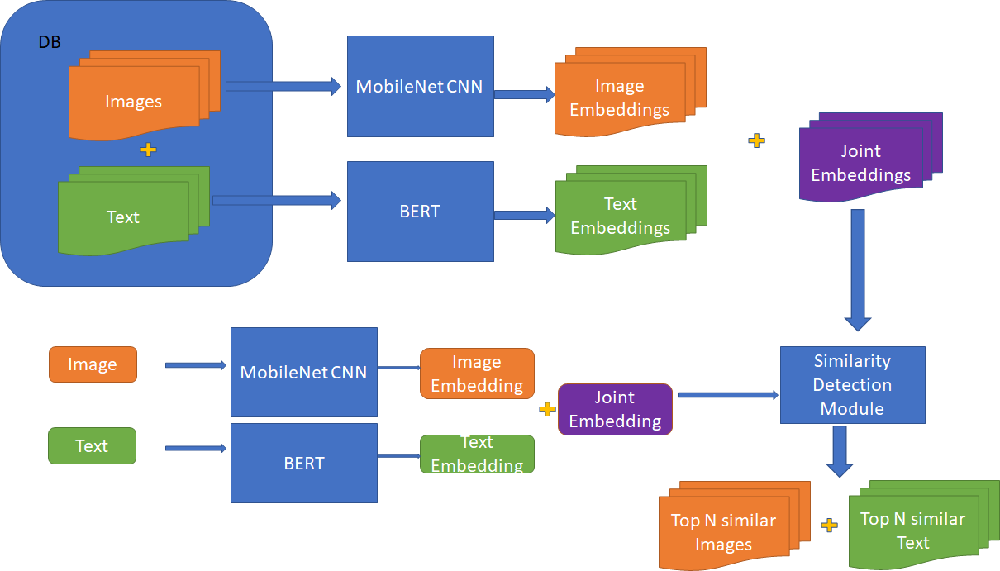

In [13]:
from sentence_transformers import SentenceTransformer, util
model = SentenceTransformer('stsb-distilbert-base')
model.max_seq_length = 128


In [14]:
IMG_SIZE = 224
size = (IMG_SIZE,IMG_SIZE)
img_model = tf.keras.applications.MobileNet(input_shape = (IMG_SIZE, IMG_SIZE, 3), include_top = False, weights = 'imagenet' )


In [15]:
def get_textEmbeddings(model,text):
    text_embedding = model.encode(text, convert_to_tensor=True)
    return text_embedding

In [16]:
def get_imageEmbeddings(model,imagePath):
    image = tf.keras.preprocessing.image.load_img(imagePath,target_size= size)
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    img_embeddings = model(input_arr)
    meanImgEmb1 = np.mean(img_embeddings,axis =0)
    meanImgEmb2 = np.mean(meanImgEmb1,axis=0)
    meanImgEmb = np.mean(meanImgEmb2,axis=0)
    return meanImgEmb

In [17]:
print(np.shape(X_train))

(20550, 4)


In [19]:
import time
text_embeddings={}
image_embeddings={}
start_time = time.time()
for index,row in  X_train.iterrows():
    txt_emb = get_textEmbeddings(model,str(row[3]))
    imagePath = 'd:/shopee-product-matching/train_images/'+row[1]
    img_emb = get_imageEmbeddings(img_model,imagePath)
    text_embeddings[row[0]] = txt_emb
    image_embeddings[row[0]] = img_emb
end_time = time.time()
print(str(end_time-start_time))

    

1204.0097811222076


In [20]:
import pickle
with open('./textEmb','wb') as handle:
    pickle.dump(text_embeddings,handle)
with open('./imgEmb','wb') as handle:
    pickle.dump(image_embeddings,handle)

In [21]:
keyList=[]
cembList=[]
imageList=[]
titleList=[]
for index, row in X_train.iterrows():
    #start_time=time.time()
    txt_emb = text_embeddings[row[0]]
    print(np.shape(txt_emb))
    img_emb = image_embeddings[row[0]] 
    print(np.shape(img_emb))
    cmb_emb = np.concatenate((txt_emb,img_emb),axis=0)
    print(np.shape(cmb_emb))
    norm = np.linalg.norm(cmb_emb)
    cmb_emb_normal = cmb_emb/norm
    keyList.append(row[0])
    cembList.append(cmb_emb_normal)
    imageList.append(row[1])
    titleList.append(row[3])

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([768])
(1024,)
(1792,)
torch.Size([76

In [22]:
from sklearn.neighbors import NearestNeighbors
kneigh = NearestNeighbors(n_neighbors=5,leaf_size=5000,algorithm='kd_tree')
kneigh.fit(cembList)

NearestNeighbors(algorithm='kd_tree', leaf_size=5000)

In [23]:
def getNeighbours(query_emb):
    posting_id_list=[]
    neigh_dist,neigh_ind = kneigh.kneighbors(X=query_emb.reshape(1,-1), n_neighbors=5, return_distance=True)
    for ind in neigh_ind:
        #print(str(ind))
        for ind1 in ind:
            posting_id_list.append(str(ind1))
    return posting_id_list

In [24]:
postingidList=[]
matchesList=[]
index =0
for val in keyList:
    query_emb = cembList[index]
    postingid_list = getNeighbours(query_emb)
    postingidList.append(val)
    matchesList.append(" ".join(postingid_list))
    index =index +1 
    if index==100:
        break

    

Chil Mil Reguler 800gr
train_2678176944


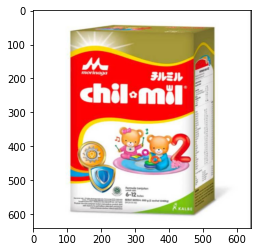

Chil Mil Reguler 800gr
train_2678176944


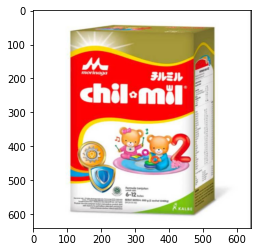

Chilmil Reguler 800gr
train_1481123795


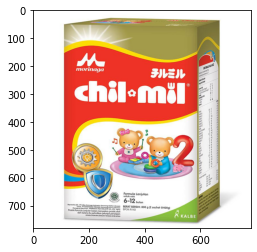

CHIL MIL GOLD 800GR
train_2668329532


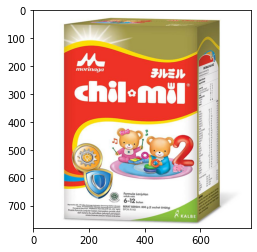

Chilmil Reguler 800gr
train_2137637747


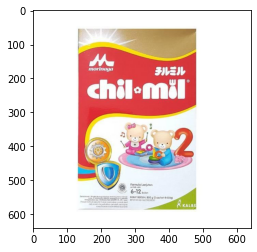

Chilmil Reguler 800 gr
train_421654747


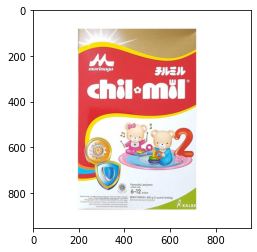

Baso aci komplit baso teh mimi
train_99369514


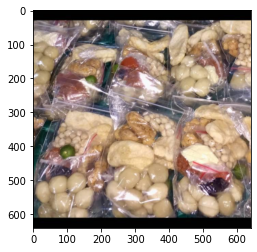

Baso aci komplit baso teh mimi
train_99369514


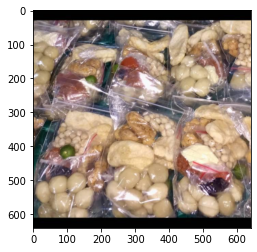

Baso Aci Milenial jumbo # ongkir gratis #
train_941001949


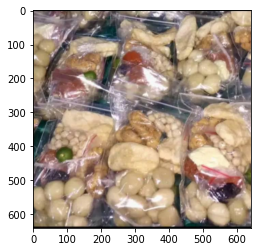

Boneka Beruang Teddy Bear Syal Topi Jumbo Murah
train_1474643472


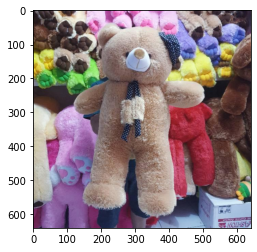

BAJU TIDUR PIYAMA CP JUMBO MOTIF KARAKTER
train_2331201860


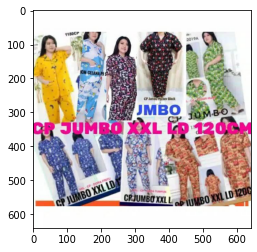

Dompet Kulit Pria Levis Ukuran Pendek 100% Kulit Asli(TAHAN BAKAR)
train_788796118


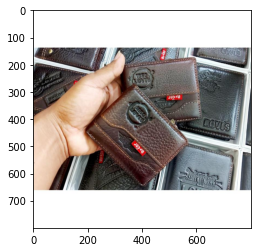

LEM TIKUS PAPAN - PERANGKAP TIKUS SUPER LENGKET
train_2662934340


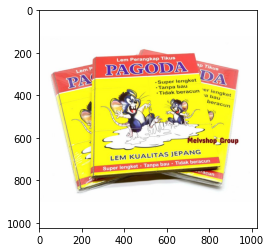

LEM TIKUS PAPAN - PERANGKAP TIKUS SUPER LENGKET
train_2662934340


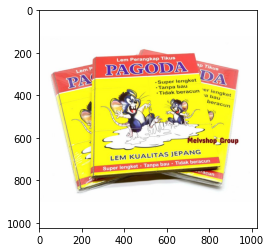

Zoetoys Buku Maze Pertamaku Dan Aktivitas Seru
train_4235546006


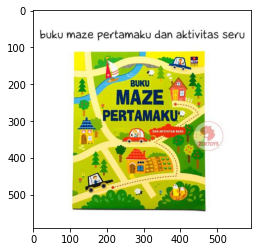

Lem perangkap Tikus Pagoda
train_3544101584


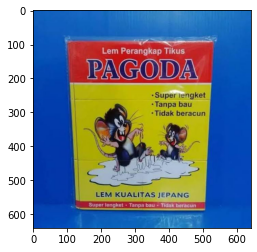

Mesin Jahit Tangan Mini Portable
train_4234390991


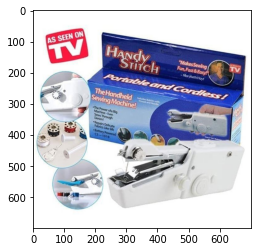

Kolam Renang Anak Murah BESTWAY #51009 + POMPA INJAK
train_2481640259


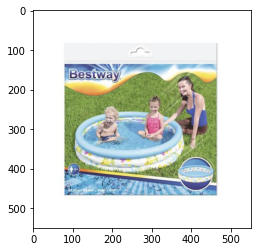

KNOW YOUR POWER - Katun Combed 30s Premium / Tumblr tee / T-Shirt / Kaos Cewek / Kaos Wanita / YOU
train_2315648915


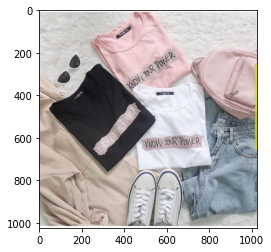

KNOW YOUR POWER - Katun Combed 30s Premium / Tumblr tee / T-Shirt / Kaos Cewek / Kaos Wanita / YOU
train_2315648915


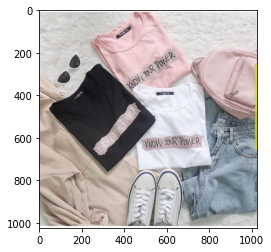

Tumblr Tee Know Ur Power | Kaos Wanita Lengan Pendek dan lengan panjang allsize Baju Bershka
train_1088802171


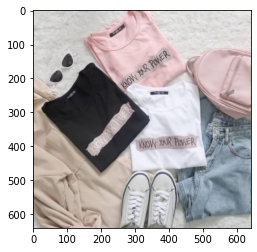

[30 Pack] Detox rahim ala JSR / Promil / Hormonal / Detox JSR  / Rempah Pack Murah dan Praktis
train_1061078100


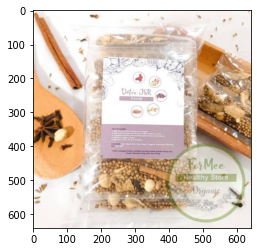

Masker Gelatin ANGKAT KOMEDO 50gr
train_1334160901


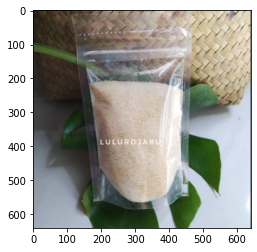

Mukena Anak Karakter LOL Paris Pink Cantik Usia 2-12 Tahun PAUD TK SD Bahan Katun Adem Motif Sajadah
train_816089570


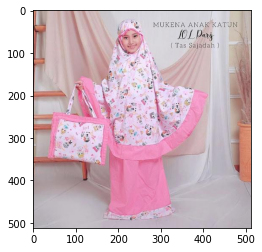

NATURAWORLD BEUTY SPRAY/NBS SERUM/SETTING SPRAY
train_3498922695


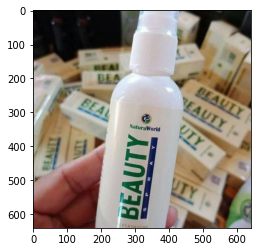

NATURAWORLD BEUTY SPRAY/NBS SERUM/SETTING SPRAY
train_3498922695


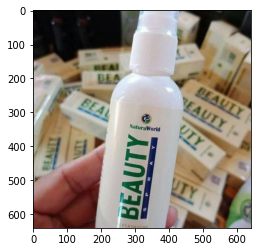

NATURA BEAUTY SPRAY FORMULA KECANTIKAN 1 botol
train_1502660407


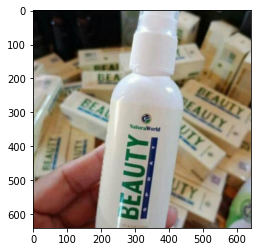

Nivea Extra White Body Serum Care & Protect
train_2220429752


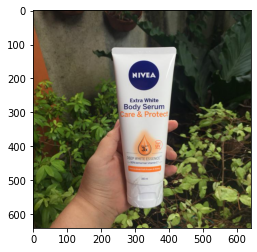

DEODORANT SR12 / DEO SPRAY / BEBAS BAU BADAN
train_1282503186


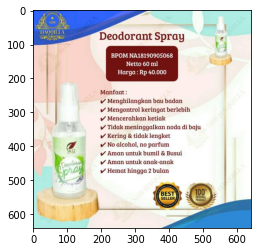

Scarlett whitening BODY LOTION / Scarlet  / HB scarlettwhitening Romansa Fantasia Charming Freshy
train_2689941075


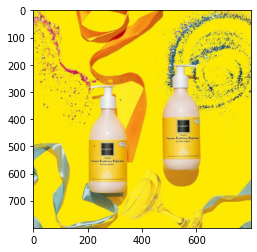

Mamas Papas Sleepsuit Set 3 in 1 Pink Flower
train_1455061225


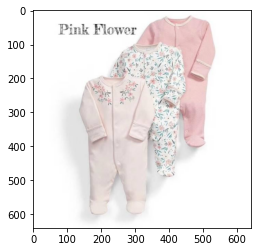

Mamas Papas Sleepsuit Set 3 in 1 Pink Flower
train_1455061225


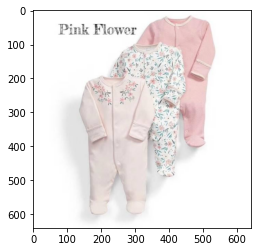

BABYPOTATO - Premium Baby Sleepsuit Motif Dandelion
train_11369548


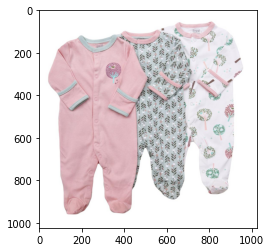

BABYMAURI - Premium Baby Sleepsuit Motif Dandelion
train_2112596726


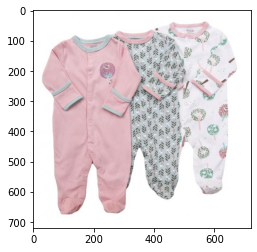

IMPORT LD - Premium Baby Sleepsuit Motif Dandelion
train_2238074966


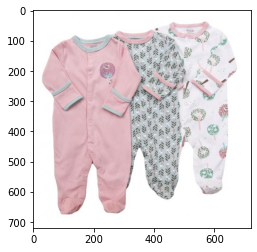

IMPORT SH - Premium Baby Sleepsuit Motif Dandelion
train_3170988485


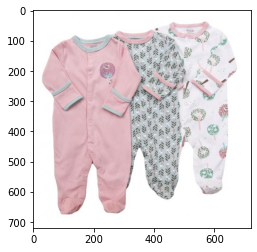

GULA AREN PADAT 1 KG MURNI NIRA AREN ATAU ENAU DESA SILURAH GULA MERAH GULA AREN
train_3903304060


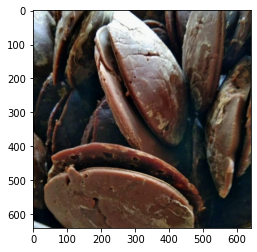

GULA AREN PADAT 1 KG MURNI NIRA AREN ATAU ENAU DESA SILURAH GULA MERAH GULA AREN
train_3903304060


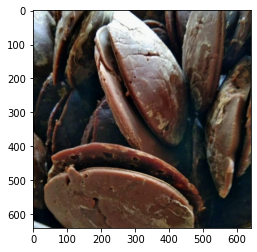

Kurma Hikmah khalas / kholas 1 yg
train_4166358012


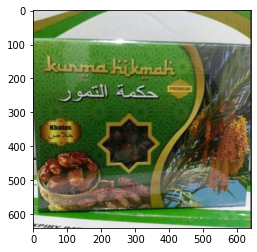

Gula aren asli baduy harga grosir 1kojor/5 iket
train_1593250562


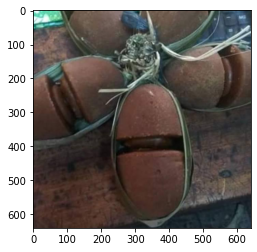

Koko bordir bapak anak bordiran no 1 kualitas bahan terbaik
train_718442310


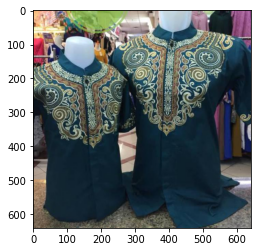

bibit tanaman jambu air kiojok super manis
train_26027635


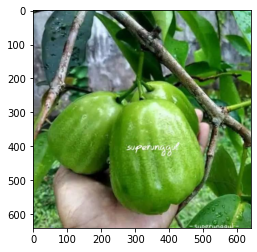

Juhi Cumi SEDAPKO
train_3254707817


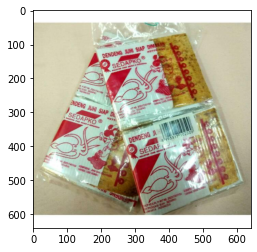

Juhi Cumi SEDAPKO
train_3254707817


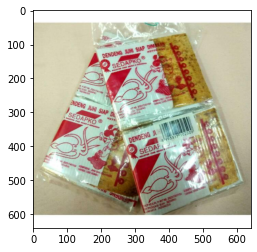

Keranjang Cucian Stand Laudry Bag Berdiri Tempat Cuci Baju Kotor Pakai
train_2281048841


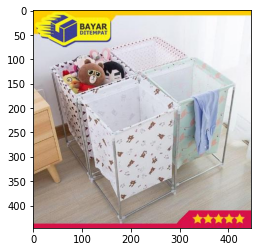

1 LUSIN POPOK KAIN BAYI MEYGA
train_3527958463


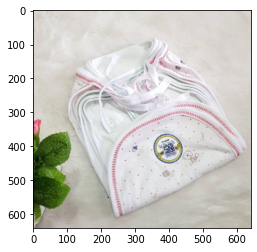

Tabita Ekonomis Kecil Lengkap Semua
train_1858861660


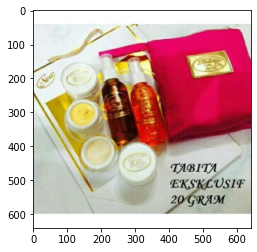

BELI 2 GRATIS 1PAKET / CREAM HN KECIL 15GR JAMINAN ASLI TIDAK ASLI UANG KEMBALI
train_2185892330


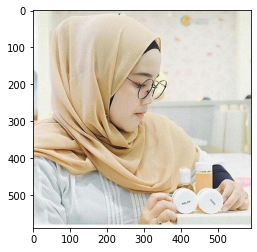

[Bisa COD] BEDONG BAYI INSTAN KATUN HALUS PRAKTIS RESLETING BEDONG TEBAL PERLENGKAPAN BAYI MURAH
train_12306551


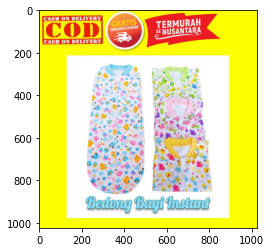

[Bisa COD] BEDONG BAYI INSTAN KATUN HALUS PRAKTIS RESLETING BEDONG TEBAL PERLENGKAPAN BAYI MURAH
train_12306551


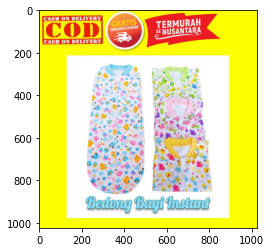

BANJIR DARAH - Kisah Nyata Aksi PKI terhadap Kiai Santri dan Kaum Muslim PENERBIT AQWAM
train_142596930


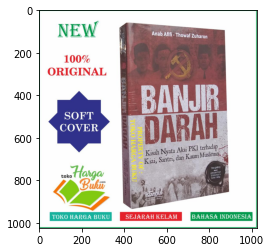

Bumbu Masak Gerak Tani
train_1424829145


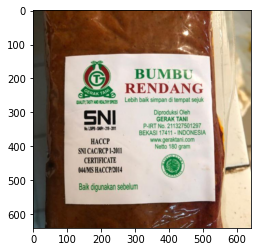

Siwak Holder Al Khair - PEELU MISWAK HOLDER - TEMPAT SIWAK PRAKTIS
train_3511483733


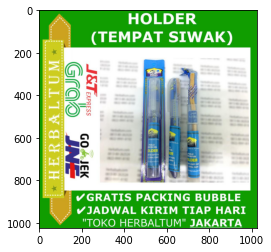

Kartu Perdana AXIS ACAK sudah Registrasi Otp Aktif
train_193445313


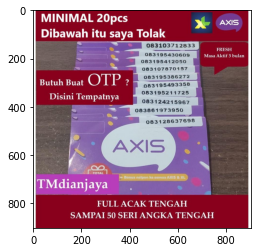

PROMINA BUBUR BAYI
train_2598294090


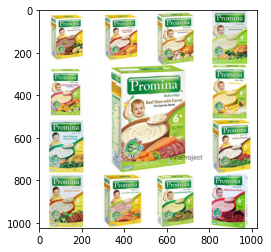

PROMINA BUBUR BAYI
train_2598294090


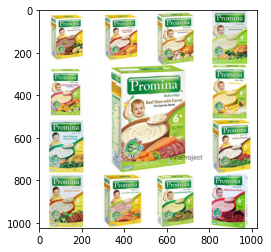

BUKU TEMATIK SD KELAS 2 TEMA 1 2 3 4 5 6 7 8 SEMESTER 1 DAN 2 KURIKULUM 2013 REVISI KEMENDIKBUD
train_3106521966


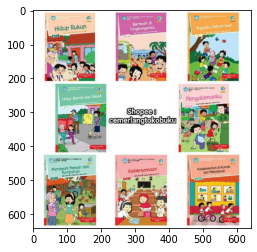

NESTLE CERELAC BUBUR BAYI 120GR
train_2563504380


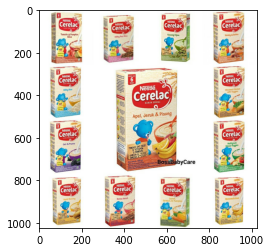

Cerelac Beras Merah Cerelac Kacang Hijau Cerelac Pisang Susu 120 gram
train_1443907224


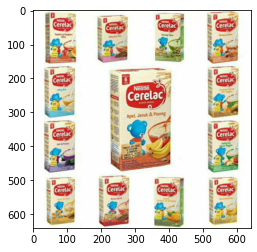

BUKU TEMATIK SD KELAS 3 TEMA 1 2 3 4 5 6 7 8 KURIKULUM 2013 REVISI KEMENDIKBUD
train_1044709849


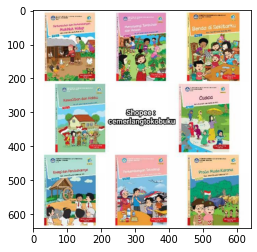

In [25]:
%matplotlib inline
index =0
for item in postingidList:
    print(titleList[index])
    print(keyList[index])
    imagePath = 'd:/shopee-product-matching/train_images/'+ imageList[index]
    pil_im = Image.open(imagePath, 'r')
    plt.figure()
    plt.imshow(pil_im)
    plt.show()
    matching_indices = matchesList[index].split(' ')
    print('==================')
    for ind in matching_indices:
        print(titleList[int(ind)])
        print(keyList[int(ind)])
        imagePath = 'd:/shopee-product-matching/train_images/'+ imageList[int(ind)]
        pil_im = Image.open(imagePath, 'r')
        plt.figure()
        plt.imshow(pil_im)
        plt.show()
    index= index +1
    if index == 10:
        break
    

In [28]:
testkeyList=[]
testcembList=[]
testimageList=[]
testtitleList=[]
for index, row in X_test.iterrows():
    #start_time=time.time()
    txt_emb = get_textEmbeddings(model,str(row[3]))
    imagePath = 'd:/shopee-product-matching/train_images/'+row[1]
    img_emb = get_imageEmbeddings(img_model,imagePath)
    text_embeddings[row[0]] = txt_emb
    image_embeddings[row[0]] = img_emb
    cmb_emb = np.concatenate((txt_emb,img_emb),axis=0)
    norm = np.linalg.norm(cmb_emb)
    cmb_emb_normal = cmb_emb/norm
    testkeyList.append(row[0])
    testcembList.append(cmb_emb_normal)
    testimageList.append(row[1])
    testtitleList.append(row[3])

In [29]:
testpostingidList=[]
testmatchesList=[]
index =0
for val in testkeyList:
    query_emb = testcembList[index]
    postingid_list = getNeighbours(query_emb)
    testpostingidList.append(val)
    testmatchesList.append(" ".join(postingid_list))
    index =index +1 
    if index==100:
        break

Gamis Anak Perempuan 5-11tahun 3tahun 4tahun 5tahun 6tahun 7tahun 8tahun 9tahun LETICIA KIDS
train_2705159396


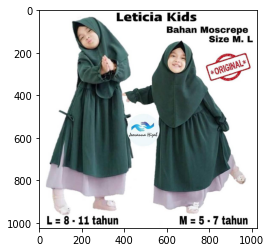

LETICIA KIDS - Gamis Anak Perempuan 5-11tahun 3tahun 4tahun 5tahun 6tahun 7tahun 8tahun 9tahun
train_2184210379


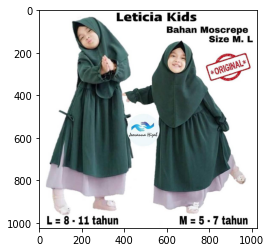

Gamis anak perempuan (BAYAR DI TEMPAT) 5-11th size M L LETICIA Saleha Series Lebaran All White
train_1464178472


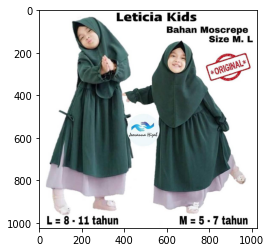

Gamis Anak Perempuan 5-11tahun 5tahun 6tahun 7tahun 8tahun 9tahun 10tahun 11tahun LECETIA KISD
train_1654827745


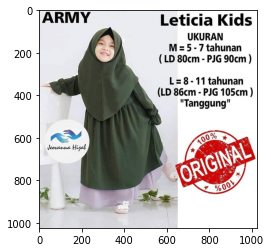

Gamis Anak Perempuan 3-10tahun 3tahun 4tahun 5tahun 6tahun 7tahun 8tahun 9tahun LECETIA KISD
train_3597458798


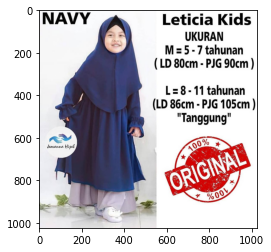

Gamis Anak Perempuan 3-10tahun 3tahun 4tahun 5tahun 6tahun 7tahun 8tahun 9tahun
train_12979365


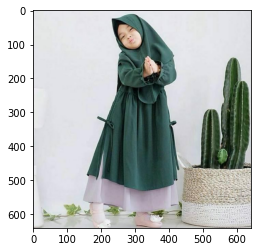

Daster Savira By ZEERA ORI
train_1120830816


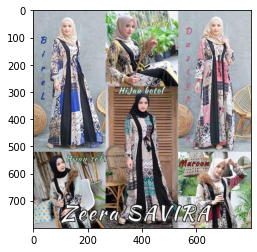

Daster arab zeera savira
train_2722675425


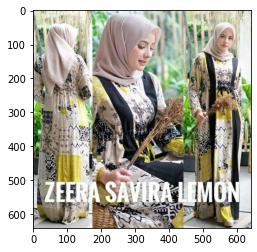

New Daster Arab Savira by Zeera Original
train_1805906291


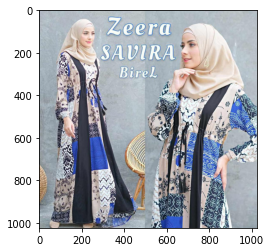

Kaftan Wanita / Pesta Wanita / Baju Kaftan Wanita Terbaru /
train_1210102540


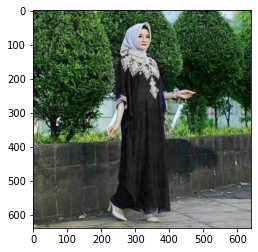

Mukena bali JUMBO REMPEL  SAKURA JEPANG(ORI AULIA)
train_1289313368


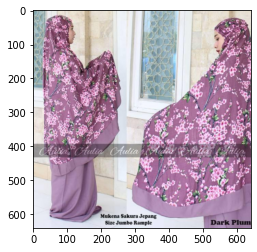

GPJ - Dress Anak Zenit Slit Rajut
train_2491752890


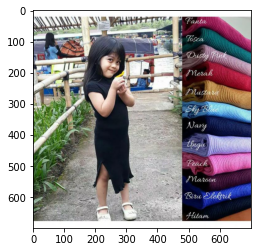

Sarung tangan oven microwave masak anti panas
train_3785111180


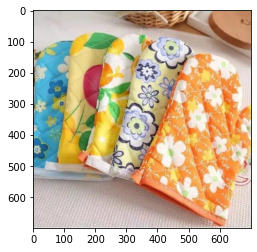

Sarung tangan oven microwave masak anti panas
train_86240045


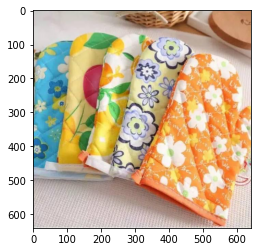

[ CH ] Sarung Tangan Anti Panas OVEN
train_408721363


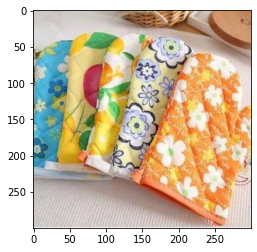

[ACQ] Sarung Tangan Oven
train_1106680837


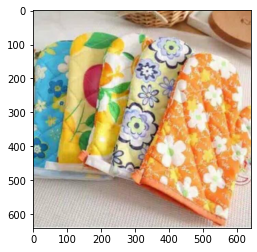

( RIC ) Sarung Tangan Anti Panas, Lap Tangan, Sarung Tangan Oven
train_2204096692


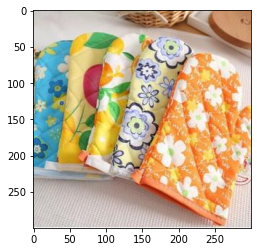

[Bayar Di Tempat]2Pcs/Pasang Sarung Tangan Memasak Tahan Panas
train_3039798619


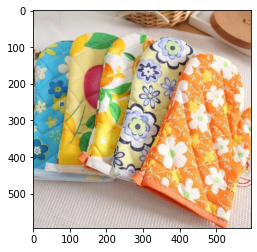

NA BOLDE Kain Refill Spray Mop Microfiber / Alat Pel
train_2276116941


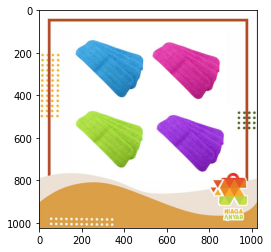

SPRAY MOP REFIL BOLDE - ISI ULANG SPAREPART KAIN SPRAYMOP
train_367133001


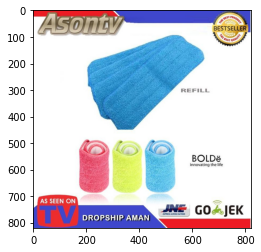

Kain Lap Microfiber Cleaning Cloth Towel Serbet Pembersih Serbaguna Murah
train_3175266145


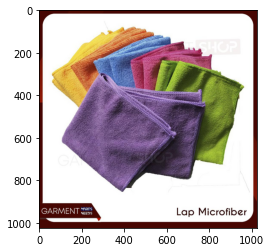

Pelindung lutut,knee protector,pelindung lutut bayi,pelindung lutut anak
train_1561643004


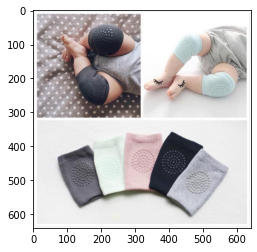

[IMPORT] - Pengait Bra Extension Penyambung tali Bra Save Kode B010
train_4143292290


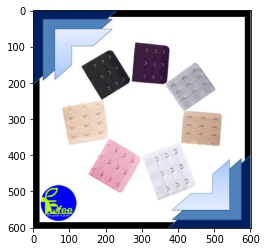

JS1086 KUAS SILIKON OLES ROTI (1KG MUAT 130PCS)/ BARBEQUE BBQ SILICONE BRUSH OLESAN TELUR MINYAK
train_3893707485


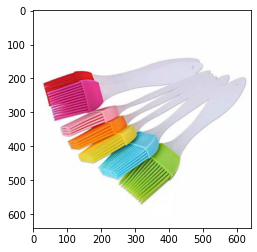

BOTOL SPRAY 500 ML
train_2727105582


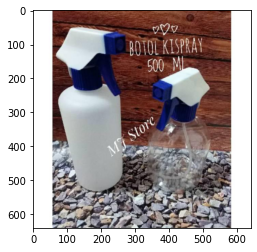

Canyon 1/2 liter / botol spray 500ml / botol semprot / botol antiseptic / botol semprot spray
train_1154619027


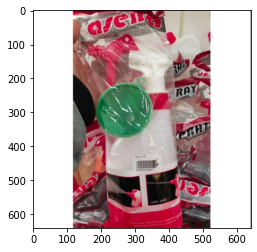

botol spray semprotan air tanaman 500ml-bottle sprayer
train_2540724354


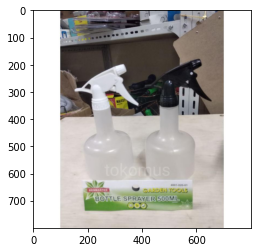

Hand Sanitizer Medika Antiseptik Handrub 500ml PUMP
train_3160785886


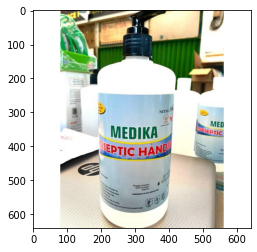

Botol Pump 500 ml Handsoap
train_441443601


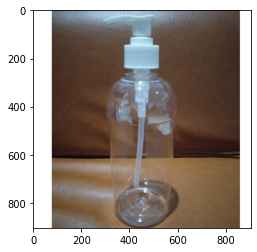

Bioderma Sensibio H2O Micellar Water 500ml with Pump
train_491239537


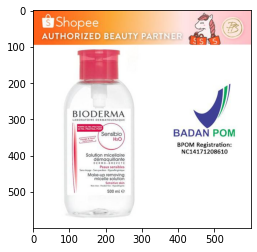

IMNUELSHOPP / BUSHIDO / GROSIR ATASAN /TSHIRT / KAOS / BAJU DISTRO BANDUNG PRIA / COWOK COMBED
train_2436481562


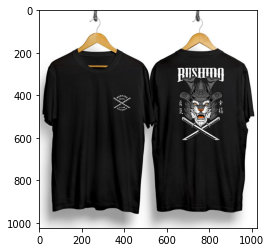

ELELYON / TOPENG BUSHIDO / GROSIR ATASAN / TSHIRT / KAOS / BAJU DISTRO BANDUNG PRIA / COWOK
train_751384044


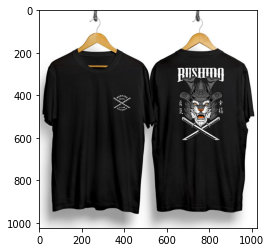

15 / KAOS BUSHIDO TIGER DRAGON BLACK / KAOS PRIA / MARMARSHOPP
train_2172204025


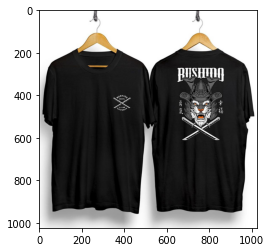

BAJU TSHIRT KAOS DISTRO BUSHIDO / ATASAN PRIA / T-SHIRT PRIA
train_4063579498


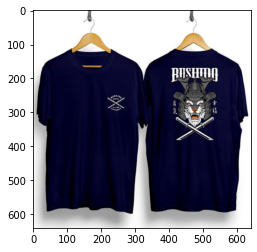

KAOS DISTRO PRIA MURAH BAJU DISTRO PRIA MURAH BAJU LAKI KAOS PRIA BRANDED KAOS PRIA LOGO VOOLOZ AIM
train_2217303706


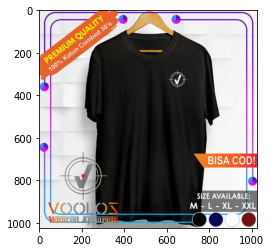

DaveCollection - Kaos Pria Kaos Distro OT Botol Miring BN20
train_871867708


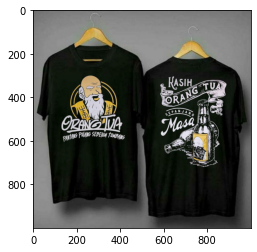

[READY] [BISA COD] [FREE GIVE] GLUTA COLLAGEN SOAP BEAUTETOX
train_467196729


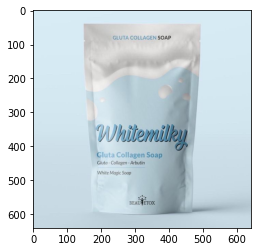

GLUTA COLLAGEN SOAP BEAUTETOX [READY]
train_3185430854


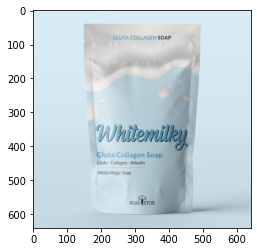

(Ready stock) (BPOM) gluta collagen soap beautetox bekasi sabun pemutih
train_2416225411


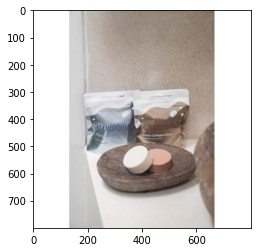

[FREE JARING SABUN] Gluta Collagen Soap [READY]
train_2840508723


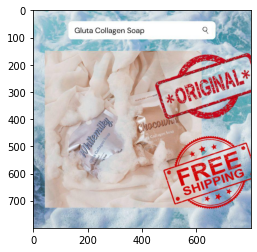

READY BOTOL SPRAY BENING KOSONG 100ML botol hand sanitizer
train_1764357950


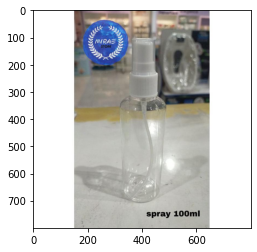

[READYSTOCK] Sabun Whitening Gluta Collagen Beautetox Chocowhite Whitemilky Soap
train_2937433253


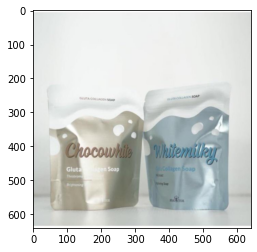

kuas silikon/kuas oles roti
train_4189824924


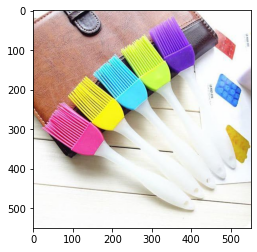

KUAS SILIKON KUE/ROTI
train_3042172278


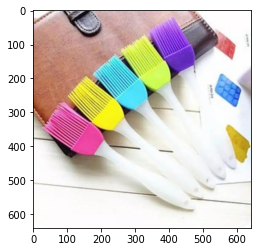

kuas roti / kuas oles cake bread / kuas silikon
train_122952880


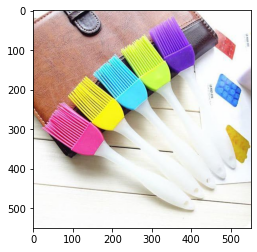

Kuas Silikon Roti / Cake / Mentega / Food Brush
train_4198005107


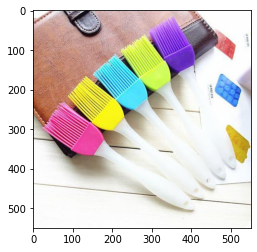

kuas Silikon kue Roti Food mentega Brush
train_1714461223


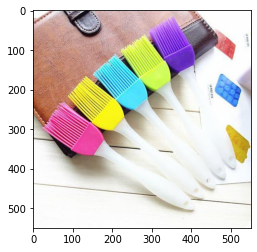

KUAS SILIKON / SILICONE BRUSH / KAUS KUE
train_3096617588


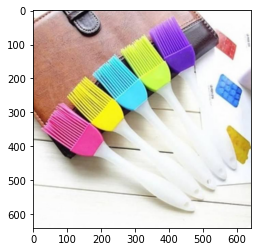

Rinnai Kompor Gas 1 Tungku \xe2\x80\x93 RI301S
train_2568939474


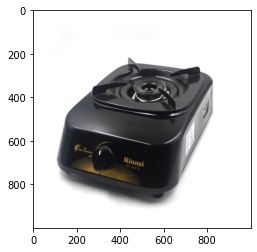

RINNAI RI 301S Kompor Gas 1 Tungku - Rinai kompor gas 1 tungku
train_3144547310


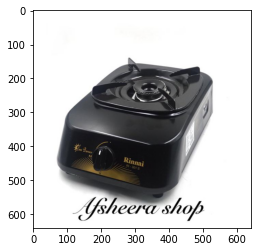

\xe2\x80\xa2 WATCHKITE \xc2\xa9\xef\xb8\x8f \xe2\x80\xa2 HAOSHUAI 1100-6 Waist Bag Tas Selempang Anti Air 2
train_2630483410


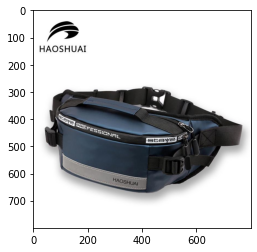

\xe3\x80\x90BISA COD\xe3\x80\x91 Toko pabrik+WhatsAPP+DZ09 Smartwatch Bluetooth dengan Kamera 2G GSM SIM TF Card
train_2885049789


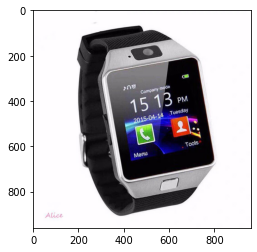

Rinnai Kompor Gas 1 Tungku - RI301S
train_2709684659


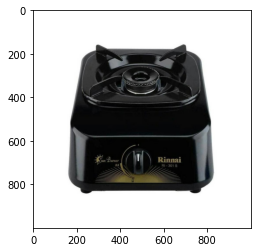

kompor gas portable progas 2 In 1 Gas Kaleng murah
train_2662961221


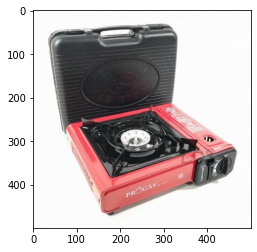

Thermostat / Pengatur Suhu 220V XH-W3001 untuk Incubator Mesin Tetas Telur Ayam Burung Lovebird
train_2412775804


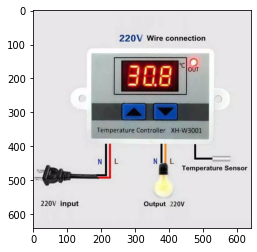

Termostat Digital 220V Termostat W3001 AC  Untuk Mesin Tetas
train_975854954


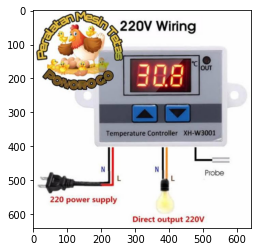

2000W SCR DIMMER 220V AC ELECTRONIC VOLTAGE REGULATOR SPEED CONTROLLER / PENGATUR KECEPATAN GERINDA
train_177654789


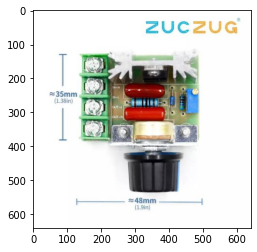

[381gr] F22 Rak gantung  Kamar Mandi serbaguna Tempat Shampoo Handuk Odol Sabun Powerful Suction
train_937465577


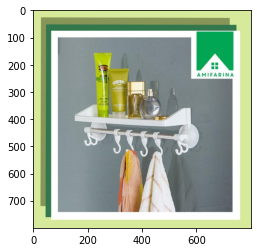

Thermostat Digital AC 220V XH W3001 Termostat Alat Pengatur Suhu Panas Dingin Mesin Tetas Telur
train_393846135


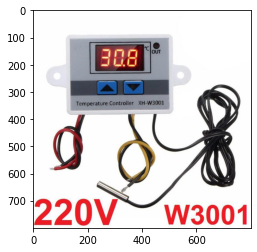

Afis Susu Daun Katuk Booster Asi Susu Pelancar Asi Susu Bubuk Kedelai Kacang Hijau
train_1389389311


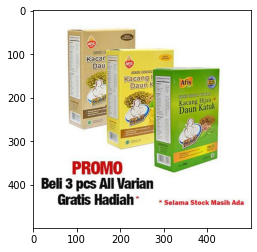

In [33]:
%matplotlib inline
index =10
while index <20:
    print(testtitleList[index])
    print(testkeyList[index])
    imagePath = 'd:/shopee-product-matching/train_images/'+ testimageList[index]
    pil_im = Image.open(imagePath, 'r')
    plt.figure()
    plt.imshow(pil_im)
    plt.show()
    matching_indices = testmatchesList[index].split(' ')
    print('==================')
    for ind in matching_indices:
        print(titleList[int(ind)])
        print(keyList[int(ind)])
        imagePath = 'd:/shopee-product-matching/train_images/'+ imageList[int(ind)]
        pil_im = Image.open(imagePath, 'r')
        plt.figure()
        plt.imshow(pil_im)
        plt.show()
    index= index +1
   
    